## **🐶 Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds**

# Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data 

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them). 




Who's that doggy in the window?

Dogs are incredible. But have you ever been sitting at a cafe, seen a dog and not known what breed it is? I have. And then someone says, "it's an English Terrier" and you think, how did they know that?

In this project we're going to be using machine learning to help us identify different breeds of dogs.

To do this, we'll be using data from the Kaggle dog breed identification competition. It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

This kind of problem is called multi-class image classification. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).

Multi-class image classification is an important problem because it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

Since the most important step in a deep learng problem is getting the data ready (turning it into numbers), that's what we're going to start with.

We're going to go through the following TensorFlow/Deep Learning workflow:
1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model ([TensorFlow Hub](https://www.tensorflow.org/hub), `tf.keras.applications`, [TensorBoard](https://www.tensorflow.org/tensorboard), [EarlyStopping](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping)).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
6. Save, sharing and reloading your model (once you're happy with the results).

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub.

The process of using a pretrained model and adapting it to your own problem is called transfer learning. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has been trained to classify images.

In [ ]:
import tensorflow as tf
print ("Print version", tf.__version__)

Print version 2.11.0


In [ ]:
try: 
  %tensorflow_version 2.x
except: 
  pass

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

print ("Availble GPU: YES!" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.11.0
Hub version: 0.12.0
Availble GPU: YES!


In [ ]:
import pandas as pd

labels_csv =  pd.read_csv("./drive/MyDrive/Data/labels.csv") 
print(labels_csv.describe()) 
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


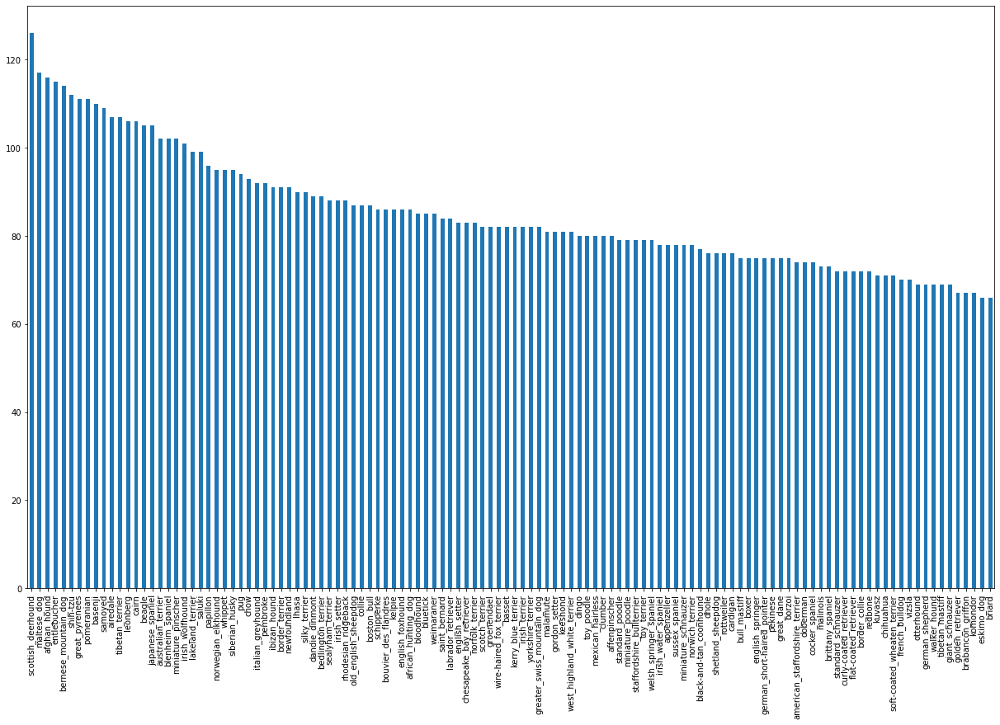

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize= (21,13 ));

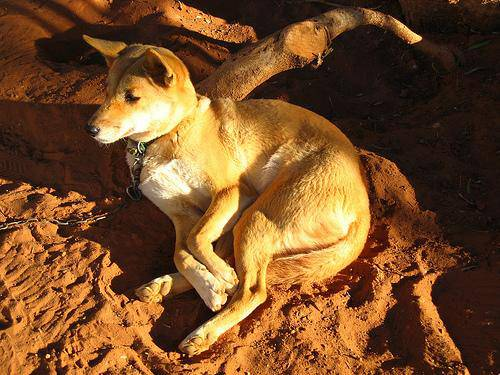

In [ ]:
from IPython.display import Image

Image("./drive/MyDrive/Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
filenames= ["./drive/MyDrive/Data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

In [ ]:
# Check whether number of filenames matches number of actual image files
import os

if ( len(os.listdir("/content/drive/MyDrive/Data/train")) == len(filenames) ):
  print("All filenames checked")


All filenames checked


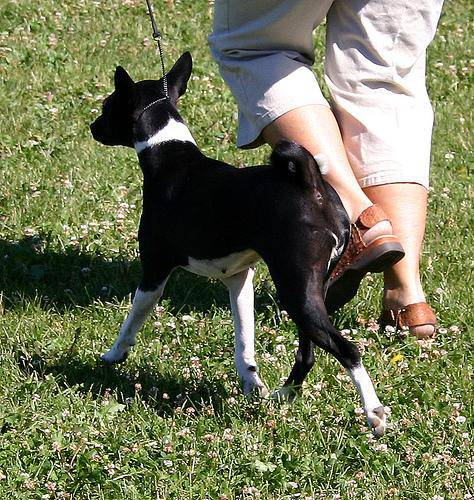

In [ ]:
# Random sampling an image
Image(filenames[8]) 

In [ ]:
import numpy as np

labels= labels_csv["breed"].to_numpy()
len(filenames)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
unique_breeds= np.unique(labels)
unique_breeds

len(unique_breeds)

120

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label== np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X = filenames
y= boolean_labels

In [ ]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1}

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val , y_train, y_val = train_test_split (X[:NUM_IMAGES], 
                                                    y[:NUM_IMAGES], 
                                                    test_size=0.2, 
                                                    random_state=42)

len(X_train), len(X_val) , len(y_train), len(y_val)

(800, 200, 800, 200)

from matplotlib.pyplot import imread 

image = imread(filenames[42])
image.shape


In [ ]:
IMG_SIZE = 224

def process_image(image_path):
  image= tf.io.read_file(image_path)
  image= tf.io.decode_jpeg(image, channels=3 )
  image= tf.image.convert_image_dtype(image, tf.float32)
  image= tf.image.resize(image, size= (224, 224) )
  return image

In [ ]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure( figsize=(10, 10)) 

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


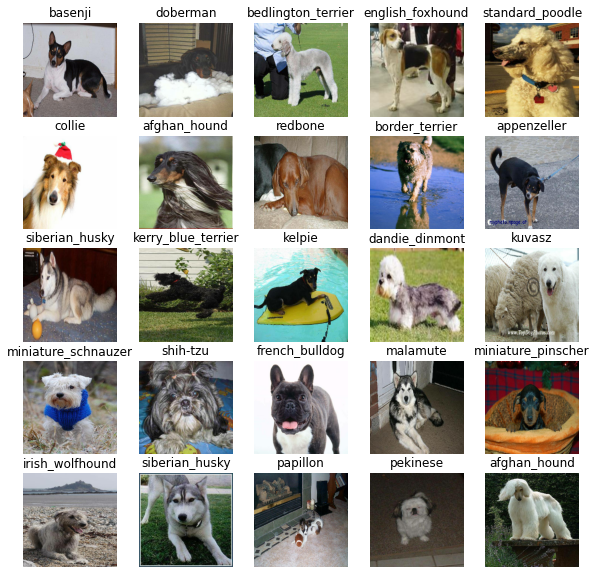

In [ ]:
train_images, train_labels  = next(train_data.as_numpy_iterator());
show_25_images(train_images, train_labels);

In [ ]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
# Create a function which builds a Keras model

def create_model ( input_shape=INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url=MODEL_URL):
  model=tf.keras.Sequential([hub.KerasLayer(MODEL_URL), #layer 1 (input)
                             tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                   activation = "softmax")]) #layer 2 (output)
  
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model= create_model()
model.summary()

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
%load_ext tensorboard
#Callback 

In [ ]:
from datetime import datetime 

 # Create a log directory for storing TensorBoard logs
def create_tensorboard_callback():
  logdir = os.path.join("/content/drive/MyDrive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                         patience= 3)

In [ ]:
EPOCHS= 100 #@param{type:slider, min:10, max:100, steps:10}

In [ ]:
def train_model():
  model = create_model() 
  tensorboard =create_tensorboard_callback() 
  model.fit(x= train_data,
            epochs= EPOCHS,
            validation_data= val_data,
            validation_freq=1, 
            callbacks = [tensorboard,early_stopping])
  return model

In [ ]:
# model  = train_model() 

In [ ]:
#Check Logs

%tensorboard --logdir drive/MyDrive/Data/logs

<IPython.core.display.Javascript object>

In [ ]:
val_pred = model.predict(val_data, verbose= 1)

7/7 [==============================] - 8s 133ms/step


In [ ]:
val_pred.shape

(200, 120)

In [ ]:
def get_pred_label (prediction):

  return unique_breeds[np.argmax(prediction)]

pred_test = get_pred_label(val_pred[0])
print(pred_test)

mexican_hairless


In [ ]:
images = []
labels = []
def unbatch (batch_set):
  for x, y in batch_set.unbatch().as_numpy_iterator():
    images.append(x)
    labels.append(unique_breeds[np.argmax(y)])
  return images, labels

val_images, val_labels = unbatch(val_data) 
val_images[0], val_labels[0] 


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  
  
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image) 
  plt.xticks([]) # make x ticks empty
  plt.yticks([]) # make y ticks empty

# Show green when it is correct, red when it is wrong

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
    
  plt.title("{} {:2.0f}% ({})".format(pred_label, 
                                      np.max(pred_prob)*100, 
                                      true_label), 
                                      color=color)




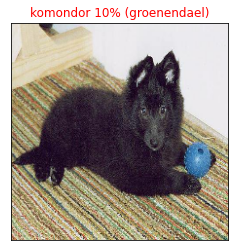

In [ ]:
plot_pred (prediction_probabilities = val_pred, 
           labels = val_labels, 
           images= val_images, 
           n=77)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]


  top_10_pred_indexes = pred_prob.argsort()[-10:]
  top_10_pred_values= pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes] 

  top_plot = plt.barh(np.arange(len(top_10_pred_labels)), 
                    top_10_pred_values,
                    color="grey")

  plt.yticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels, 
             color = "grey")
           
  #Change color for the true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

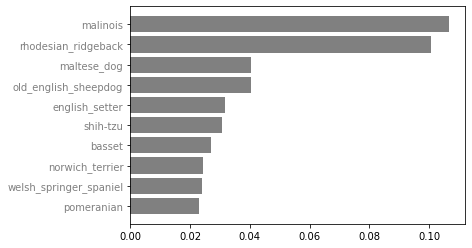

In [ ]:
plot_pred_conf(prediction_probabilities= val_pred, 
                labels = val_labels,
                n=9)

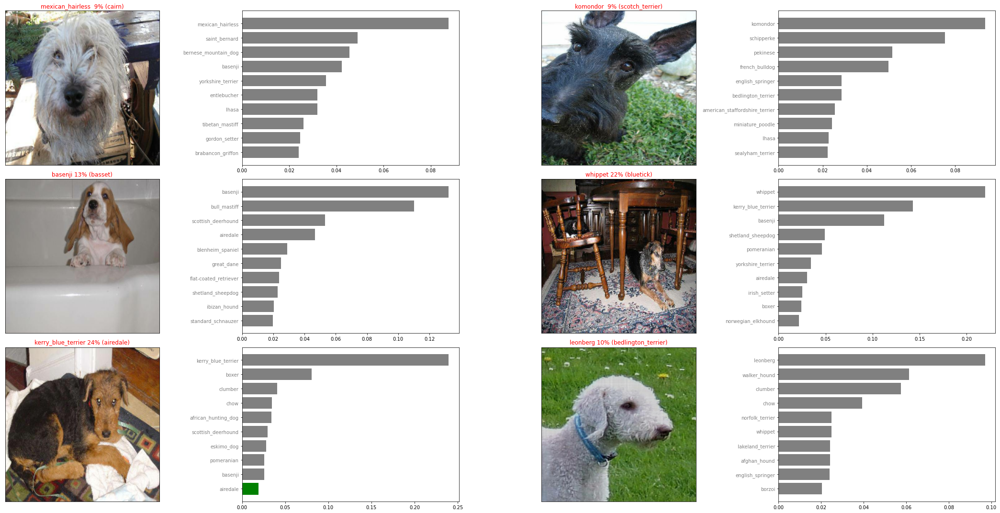

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize= (15*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=val_pred, 
            labels=val_labels, 
            images= val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=val_pred,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show();



In [ ]:
def save_model(model, suffix=None):
  # Create model directory with current time
  modeldir=os.path.join("/content/drive/MyDrive/Data/models", 
                        datetime.now().strftime("%Y-%m-%d-%H%M%s"))
  model_path= modeldir + "-" + suffix + ".h5" 
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from :{model_path}")
  model= tf.keras.models.load_model(model_path,
                                    custom_objects={"KerasLayer": hub.KerasLayer})

  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Data/models/2023-02-16-03431676518981-1000-images-Adam.h5


'/content/drive/MyDrive/Data/models/2023-02-16-03431676518981-1000-images-Adam.h5'

In [ ]:
load_1000_Model= load_model("/content/drive/MyDrive/Data/models/2023-02-16-02481676515681-1000-images-Adam.h5")

Loading saved model from :/content/drive/MyDrive/Data/models/2023-02-16-02481676515681-1000-images-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 2s 132ms/step - loss: 5.6031 - accuracy: 0.0050


[5.603147506713867, 0.004999999888241291]

In [ ]:
load_1000_Model.evaluate(val_data)

7/7 [==============================] - 2s 90ms/step - loss: 1.3256 - accuracy: 0.6500


[1.325551152229309, 0.6499999761581421]

## **Train full data**

In [ ]:
len(X) , len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_model = create_model()

In [ ]:
full_model_tensorboard= create_tensorboard_callback()


# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                         patience= 3)

In [ ]:
# full_model.fit(x=full_data,
#                epochs=EPOCHS,
#                callbacks=[full_model_tensorboard, 
#                           full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 108ms/step - loss: 1.3359 - accuracy: 0.6678
Epoch 2/100
320/320 [==============================] - 34s 105ms/step - loss: 0.4068 - accuracy: 0.8799
Epoch 3/100
320/320 [==============================] - 37s 116ms/step - loss: 0.2423 - accuracy: 0.9318
Epoch 4/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1576 - accuracy: 0.9614
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1087 - accuracy: 0.9783
Epoch 6/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0789 - accuracy: 0.9864
Epoch 7/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0592 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0480 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 36s 113ms/step - loss: 0.0380 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 33s 103m

In [ ]:
type(full_model)

keras.engine.sequential.Sequential

In [ ]:
# save_model(full_model, suffix="COMPLETE_FULL_MODEL")

Saving model to: /content/drive/MyDrive/Data/models/2023-02-16-03541676519663-COMPLETE_FULL_MODEL.h5


'/content/drive/MyDrive/Data/models/2023-02-16-03541676519663-COMPLETE_FULL_MODEL.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Data/models/2023-02-16-03541676519663-COMPLETE_FULL_MODEL.h5")

Loading saved model from :/content/drive/MyDrive/Data/models/2023-02-16-03541676519663-COMPLETE_FULL_MODEL.h5


In [ ]:
test_path =  "/content/drive/MyDrive/Data/test/"
test_files= [test_path + fname for fname in os.listdir(test_path)]

test_files[:10]

['/content/drive/MyDrive/Data/test/e01a1ea716359e2f0062aca591ff9ca4.jpg',
 '/content/drive/MyDrive/Data/test/dfc5d207b533d381045984a0a0adb23c.jpg',
 '/content/drive/MyDrive/Data/test/e07e608afaa89ee4ee939ad0a3bd3224.jpg',
 '/content/drive/MyDrive/Data/test/e2915c191c0bc761b795b78f66845fe0.jpg',
 '/content/drive/MyDrive/Data/test/e5a78d4d53fc5957cc9dedd318139d3d.jpg',
 '/content/drive/MyDrive/Data/test/e1c6c50bbaee219e7faf29e9c1c343ca.jpg',
 '/content/drive/MyDrive/Data/test/e386eaa78980be7183ecfdd32ecd2aab.jpg',
 '/content/drive/MyDrive/Data/test/e70dfb4bf50f74850463cfd35edc8af5.jpg',
 '/content/drive/MyDrive/Data/test/e291c3955198350ab26495e9290dbe34.jpg',
 '/content/drive/MyDrive/Data/test/e3dd8fc9162f726122ca4cc783114c81.jpg']

In [ ]:
len(test_files)

10357

In [ ]:
test_batches = create_data_batches(test_files, test_data=True)

Creating test data batches...


In [ ]:
test_batches

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_pred = loaded_full_model.predict(test_batches, 
                                      verbose=1)

324/324 [==============================] - 36s 111ms/step


In [ ]:
np.savetxt("/content/drive/MyDrive/Data/test_pred.csv", test_pred, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Data/test_pred.csv" , delimiter=",")

In [ ]:
preds_df=  pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
test_path = "drive/My Drive/Data/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df[list(unique_breeds)] = test_predictions

In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Data/Full_MODEL_KAGGLE_SUBMISSION.csv", index=False)

## **Testing on Custom Images!**

In [ ]:
custom_images = "/content/drive/MyDrive/Data/custom_images/"
custom_images_path = [custom_images + fname for fname in os.listdir(custom_images)]

In [ ]:
custom_data = create_data_batches(custom_images_path, test_data=True)

Creating test data batches...


In [ ]:
custom_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#predict custom data

custom_preds =  loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 610ms/step


In [ ]:
custom_labels_preds = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_labels_preds

# custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
# custom_pred_labels

['pug']

In [ ]:
#Unbatchify 

image_list = [] 

#loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  image_list.append(image) 

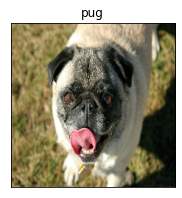

In [ ]:
# Check custom image predictions

plt.figure(figsize=(10, 10))
for i, image in enumerate(image_list):
  plt.subplot(1,3, i+1) 
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_labels_preds[i])
  plt.imshow(image)



# plt.figure(figsize=(10, 10))
# for i, image in enumerate(custom_images):
#   plt.subplot(1, 3, i+1)
#   plt.xticks([])
#   plt.yticks([])
#   plt.title(custom_pred_labels[i])
#   plt.imshow(image)